# test to load local package

#### try on dataset c20200927 c20201113 in folder SPOTSAR/test_data


In [1]:
# import external packages
import numpy as np
import pandas as pd
import numba
from numba import vectorize
import glob # for file search
import copy
import os # operating system stuff
import re # regex
import fastparquet # fast read/write for large data structures
import sklearn.preprocessing as pre # for data normalisation
from sklearn.metrics import pairwise_distances

import geopandas as gpd
import rasterio as rio
import rasterio.mask
from rasterio.plot import plotting_extent
from shapely.geometry import Polygon
from shapely.geometry.point import Point
import pyproj
from pyproj import CRS
from inpoly import inpoly2 # for fast inpolygon checks
import utm


import matplotlib.pyplot as plt 
import matplotlib.dates as mdates
from matplotlib import cm as mpl_cm
from matplotlib import colors as mcolors 

from mpl_toolkits.axes_grid1 import make_axes_locatable # for colorbar scaling
from mpl_toolkits.axes_grid1 import ImageGrid
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter

import seaborn as sns
from matplotlib import rc_file_defaults
rc_file_defaults()
# sns.set(style=None, color_codes=True)



from shapely.geometry import Polygon
from shapely.geometry.point import Point
import datetime

import configparser

from cmcrameri import cm # for scientific colourmaps

###########################
# import main local package
import SPOTSAR_main as sm


In [2]:
################ Define user INPUTS #######################
######## please edit the values of this block only ########
###########################################################

# define hillshade file
HS_FILE = './test_data/DEM/TDX_Merapi_WGS84_HS.tif'

# define lon and lat files
LON_FILE = './test_data/CSK_dsc/geo/20200910.lon'
LAT_FILE = './test_data/CSK_dsc/geo/20200910.lat'

# define parameter text file
PARAM_FILE = './test_data/CSK_dsc/params.txt'

# define map region of interest
lon_lims = [110.425, 110.45]
lat_lims = [-7.555, -7.535]

# define colour range {min max} (min = -max)
vmax = 3 # range of colourscale in meters

# define file names for data, lon and lat
DIRECTORY_PATH = "./test_data/CSK_dsc/OFFS/"
# define path to ccp and ccs files
DIRECTORY_PATH_CCS = "./test_data/CSK_dsc/CCS/"

# Set the regular expression pattern to match the file names
PATTERN = r"^c[0-9]+_c[0-9]+_disp_[0-9]+_[0-9]+\.txt$"
# Set the regular expression pattern to match the ccs file names
PATTERN_CCS = r"^c[0-9]+_c[0-9]+_ccs_[0-9]+_[0-9]+$"



In [3]:
# open hillshade file and re-order offset and CCS files

# open hill shade file with rasterio
DEM_HS = rio.open(HS_FILE)
SHADING = DEM_HS.read(1,masked=True) # rasterio bands are indexed from 1

# extract DEM extent
DEM_EXTENT=[DEM_HS.bounds.left,DEM_HS.bounds.right,DEM_HS.bounds.bottom,DEM_HS.bounds.top]

# reorder file using Post_processing.reorder_files
matching_files = sm.Post_processing.reorder_files(DIRECTORY_PATH,PATTERN,0)
matching_files_ccs = sm.Post_processing.reorder_files(DIRECTORY_PATH_CCS,PATTERN_CCS,0)

# test if file ordering has worked
print(matching_files)
print(matching_files_ccs)

['c20200927_c20201113_disp_42_20.txt', 'c20200927_c20201113_disp_74_36.txt', 'c20200927_c20201113_disp_108_52.txt', 'c20200927_c20201113_disp_140_68.txt', 'c20200927_c20201113_disp_174_84.txt', 'c20200927_c20201113_disp_206_100.txt', 'c20200927_c20201113_disp_240_116.txt', 'c20200927_c20201113_disp_272_132.txt', 'c20200927_c20201113_disp_306_148.txt', 'c20200927_c20201113_disp_340_164.txt', 'c20200927_c20201113_disp_372_180.txt']
['c20200927_c20201113_ccs_42_20', 'c20200927_c20201113_ccs_74_36', 'c20200927_c20201113_ccs_108_52', 'c20200927_c20201113_ccs_140_68', 'c20200927_c20201113_ccs_174_84', 'c20200927_c20201113_ccs_206_100', 'c20200927_c20201113_ccs_240_116', 'c20200927_c20201113_ccs_272_132', 'c20200927_c20201113_ccs_306_148', 'c20200927_c20201113_ccs_340_164', 'c20200927_c20201113_ccs_372_180']


In [4]:
# read parameters from text file
config = configparser.ConfigParser()
config.read(PARAM_FILE)
WIDTH = int(config.get('params', 'width'))
LINES = int(config.get('params', 'lines'))
WIDTH_CCS = int(config.get('params', 'width_ccs'))
LINES_CCS = int(config.get('params', 'lines_ccs'))
R_START = int(config.get('params', 'r_start'))
A_START = int(config.get('params', 'a_start'))
R_STEP = int(config.get('params', 'r_step'))
A_STEP = int(config.get('params', 'a_step'))
HEADING = float(config.get('params', 'heading'))
MEAN_INC = float(config.get('params', 'mean_inc'))

In [5]:

# load data from files into class multi-kernel
datastack = sm.Post_processing.MultiKernel(DIRECTORY_PATH,
                                           matching_files,
                                           DIRECTORY_PATH_CCS,
                                           matching_files_ccs,
                                           LAT_FILE,
                                           LON_FILE,
                                           HEADING,
                                           MEAN_INC,
                                           LINES_CCS,
                                           WIDTH_CCS)
# We need to assign some data not stored in the disp.txt files.
datastack.get_params_from_file_name()
datastack.get_latlon_from_file(WIDTH)
datastack.add_lat_lon_to_data(R_START,A_START)
datastack.crop_stack_ccs(R_STEP,A_STEP)
# the object datastack now has several attributes associated with the whole dataset (e.g., date1, date2, heading)
# Next we add all the offset data (disp.txt) to the stack
stacked_data = datastack.assign_data_to_stack(R_STEP,A_STEP)
# The attribute 'Stack' we find a list of single-kernel objects which contain the actual offset data, ccp and ccs data and the coordinates.




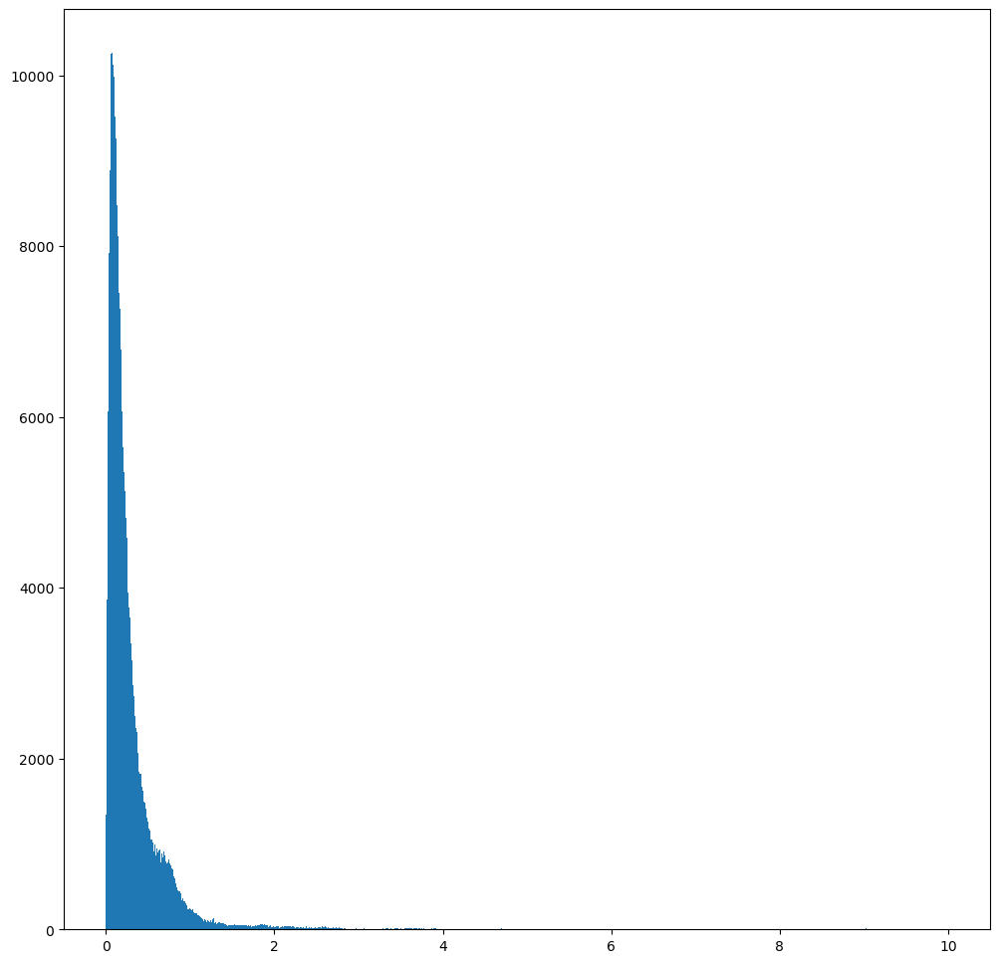

In [6]:
# test some plotting functions
# next to do 
test_obj = stacked_data[4]
sm.plot.plot_hist(test_obj,'Mag_vec', 1000,[],1, [0,10])
R_off_compare = getattr(test_obj,'R_off')
A_off_compare = getattr(test_obj,'A_off')
lon_off_compare = getattr(test_obj,'Lon_off')
lat_off_compare = getattr(test_obj,'Lat_off')

In [7]:
%matplotlib osx
sel = [0,2,4,6,8]
fig, ax = plt.subplots(len(sel),1,figsize=(10,10),sharex=True)

for i, obj_id in enumerate(sel):
    obj = datastack.Stack[obj_id]
    # sm.plot.plot_hist(obj,'Mag_vec', 300,(fig,ax[i]), 0.5, [0,4])
    sm.plot.plot_hist(obj,'Mag_vec', 1000,(fig,ax[i]), 0.5,)
    ax[i].set_yscale('log')
    R_win, A_win = getattr(obj,'R_win'), getattr(obj,'A_win')
    pix_R = 0.34*R_win
    pix_A = 0.70*A_win
    ax[i].axvline(pix_R/2,color='Red')
    ax[i].axvline(pix_A/2,color='Blue')
    ax[i].axvline(np.sqrt((pix_R/2)**2 +(pix_A/2)**2),color='Green')
    ax[i].set_title(f'Slant range: {R_win}, Azimuth: {A_win}')
    ax[i].set_ylabel('Count')
    ax[i].set_xlim([0,25])
ax[i].set_xlabel('Displacment magnitude [m]')
fig.tight_layout()

In [8]:
## check local std before outlier removal
# query points
q1 = [110.446216,-7.536389] # stable no veg north
q2 = [110.42647,-7.53297] # stable veg north west
q3 = [110.4421429,-7.5377992] # L1888
q4 = [110.44214,-7.54237] # L1998 large disp
q5 = [110.44013,-7.54678] # stable no veg south
q6 = [110.44200,-7.53604] # L1956 offset gradient
query_points = np.stack((q1,q2,q3,q4,q5,q6))
r = 50

indeces = [0,2,4,6]
stats_list, coordinate_circles = datastack.query_point_stack('R_off_vec',
                                                             query_points[:,1],
                                                             query_points[:,0],
                                                             r,
                                                             indeces)

print(stats_list)

[[42, 20, array([ 0.01397702, -0.0314684 ,  1.505052  ,  2.72681851,  0.04317531,
        0.29078445]), array([ 0.01617422, -0.03155605,  1.57032798,  3.05180095,  0.02181926,
        0.2447759 ]), array([0.46916584, 0.60705792, 0.61806351, 1.4576705 , 0.59688131,
       0.38382368]), array([[-0.43610301,  0.79919182],
       [-1.22633064,  1.66147763],
       [ 0.27832404,  2.72166465],
       [-1.08099768,  4.85721342],
       [-0.88849309,  1.34711525],
       [ 0.02964643,  0.51758116]])], [108, 52, array([ 0.00698769, -0.00932862,  1.58460413,  3.38768477,  0.02570186,
        0.25155241]), array([ 0.01252847, -0.05552147,  1.58209528,  3.38671313,  0.02715618,
        0.25089094]), array([0.04678563, 0.38823887, 0.07024511, 0.70172086, 0.02363273,
       0.0283833 ]), array([[-0.1209948 ,  0.08257868],
       [-0.66480456,  1.02403294],
       [ 1.45286944,  1.78957934],
       [ 2.6651    ,  3.89534978],
       [-0.02818057,  0.06979006],
       [ 0.19286397,  0.31262353]])], [1

In [12]:
# perfrom outlier detection and removal for all windows
single_cluster = False
cluster_selection_epsilon = 0.0

overlap_factors = [25,50,100,200,400,800]
min_sample_factors = np.array([0.0001,0.2,0.4,0.6,0.8,1])
HDBSCAN_list_list = []
GLOSH_list_list = []
LOF_list_list = []
count_list = [4]
stack_list = [datastack.Stack[idx] for idx in count_list]
import time
start = time.time()

for obj in stack_list:
    HDBSCAN_list = []
    GLOSH_list = []
    LOF_list = []
    for overlap_factor in overlap_factors:
        print(f'current window size: {obj.R_win}, {obj.A_win}')
        # overlap = int(np.ceil((obj.R_win/R_STEP)) * np.ceil(obj.A_win/A_STEP)) # number of overlapping windows that share >50% with query window
        # min_cluster_size = np.max([2,np.round(overlap*overlap_factor)])
        min_cluster_size = overlap_factor
        min_sample_vec = np.ceil(overlap_factor*min_sample_factors)
        print(min_sample_vec)
        for min_sample in min_sample_vec:
            print('HDBSCAN params:',min_cluster_size, min_sample)
            obj.prep_DBSCAN(1,1,100)
            obj.run_PCA(4)
            HDBSCAN_labels, GLOSH_probabilities, HDBSCAN_probabilities = obj.run_HDBSCAN(int(min_cluster_size),int(min_sample),single_cluster,cluster_selection_epsilon)
            LOF_labels, LOF_negative_score = obj.run_LOF(n_neighbors=int(min_cluster_size),algorithm='auto',leaf_size=30,contamination='auto')
            # obj.rem_outliers_HDBSCAN()
            HDBSCAN_list.append( HDBSCAN_probabilities)
            GLOSH_list.append(GLOSH_probabilities)
            LOF_list.append(LOF_negative_score)
            print(f'{overlap_factor}, {min_sample} time: {time.time()-start}')
    HDBSCAN_list_list.append(HDBSCAN_list)
    GLOSH_list_list.append(GLOSH_list)
    LOF_list_list.append(LOF_list)




current window size: 174, 84
[ 1.  5. 10. 15. 20. 25.]
HDBSCAN params: 25 1.0
25, 1.0 time: 65.96304106712341
HDBSCAN params: 25 5.0
25, 5.0 time: 109.82832479476929
HDBSCAN params: 25 10.0
25, 10.0 time: 150.06201076507568
HDBSCAN params: 25 15.0
25, 15.0 time: 190.5164668560028
HDBSCAN params: 25 20.0
25, 20.0 time: 229.94864201545715
HDBSCAN params: 25 25.0
25, 25.0 time: 269.3454210758209
current window size: 174, 84
[ 1. 10. 20. 30. 40. 50.]
HDBSCAN params: 50 1.0
50, 1.0 time: 314.6836018562317
HDBSCAN params: 50 10.0
50, 10.0 time: 358.20466685295105
HDBSCAN params: 50 20.0
50, 20.0 time: 402.681480884552
HDBSCAN params: 50 30.0
50, 30.0 time: 447.47740387916565
HDBSCAN params: 50 40.0
50, 40.0 time: 499.8434998989105
HDBSCAN params: 50 50.0
50, 50.0 time: 552.1970789432526
current window size: 174, 84
[  1.  20.  40.  60.  80. 100.]
HDBSCAN params: 100 1.0
100, 1.0 time: 611.2197318077087
HDBSCAN params: 100 20.0
100, 20.0 time: 670.2823989391327
HDBSCAN params: 100 40.0
100, 4

/Users/markbemelmans/Documents/PhD/projects/SPOTSAR/SPOTSAR_main/Post_processing/singlekernel.py:378: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig3, ax = plt.subplots(1, 5, figsize=(8, 8))


100, 60.0 time: 832.0328979492188
HDBSCAN params: 100 80.0
100, 80.0 time: 923.1947116851807
HDBSCAN params: 100 100.0
100, 100.0 time: 1014.923497915268
current window size: 174, 84
[  1.  40.  80. 120. 160. 200.]
HDBSCAN params: 200 1.0
200, 1.0 time: 1120.4980359077454
HDBSCAN params: 200 40.0
200, 40.0 time: 1230.7961897850037
HDBSCAN params: 200 80.0
200, 80.0 time: 1328.4944169521332
HDBSCAN params: 200 120.0
200, 120.0 time: 1427.0968699455261
HDBSCAN params: 200 160.0
200, 160.0 time: 1530.9880998134613
HDBSCAN params: 200 200.0
200, 200.0 time: 1636.7585759162903
current window size: 174, 84
[  1.  80. 160. 240. 320. 400.]
HDBSCAN params: 400 1.0
400, 1.0 time: 1790.1095478534698
HDBSCAN params: 400 80.0
400, 80.0 time: 1943.0528848171234
HDBSCAN params: 400 160.0
400, 160.0 time: 2124.356416940689
HDBSCAN params: 400 240.0
400, 240.0 time: 2335.213090658188
HDBSCAN params: 400 320.0
400, 320.0 time: 2537.2832267284393
HDBSCAN params: 400 400.0
400, 400.0 time: 2753.2952148914

In [ ]:
import copy
import matplotlib.pyplot as plt
import numpy as np
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.gridspec import GridSpec

from cmcrameri import cm

import pyproj
from pyproj import CRS

def plot_vec_attr(ax,obj,attr,step,scale,width =0.005 ,attr_lims=[0,1],qk_length=1,shading = [],dem_extent = [],lat_lims = [],lon_lims = []):
    """
    Plots displacement as vectors in slantrange - azimuth plane and 
    assigns colour based on attribute value and limits

    Args:
        obj (class object): _description_
        attr (str): _description_
        step (int): _description_
        scale (int): _description_
        attr_lims (list of floats, optional): _description_. Defaults to [0,1]
        qk_length (float, optional): _description_. Defaults to 1
        shading (np.array, optional): _description_. Defaults to [] -> do not use.
        dem_extent (list, optional): _description_. Defaults to [] -> do not use.
        lat_lims (list, optional): _description_. Defaults to [] -> do not use.
        lon_lims (list, optional): _description_. Defaults to [] -> do not use.
    """
    # get length of 1 deg. for scalebar
    distance_meters = sm.plot.get_1deg_dist()

    # copy data to manipulate limits without messing with the original data
    if attr != []:
        attr_copy = copy.deepcopy(attr)

        # change limits for nicer plotting
        attr_copy[attr_copy<attr_lims[0]] = attr_lims[0]
        attr_copy[attr_copy>attr_lims[1]] = attr_lims[1]

    if lat_lims == []:
        lat_lims = [np.min(obj.Lat_off_vec),np.max(obj.Lat_off_vec)]
    
    if lon_lims == []:
        lon_lims = [np.min(obj.Lon_off_vec),np.max(obj.Lon_off_vec)]

    # plotting
    # fig1, axes = plt.subplots(1,1,figsize=(8,8))
    if (dem_extent != []):
        ax.imshow(shading,cmap=cm.grayC,alpha=0.5, extent=dem_extent)
    
    if attr == []:
        q = ax.quiver(obj.Lon_off[::step,::step],obj.Lat_off[::step,::step],
                    obj.X_off[::step,::step],obj.Y_off[::step,::step],
                    color='black',
                    scale=scale, 
                    width = width, 
                    edgecolor='black',
                    linewidth=0.2)
    else:
        q = ax.quiver(obj.Lon_off[::step,::step],obj.Lat_off[::step,::step],
                        obj.X_off[::step,::step],obj.Y_off[::step,::step],
                        attr_copy[::step,::step],
                        scale=scale, 
                        width = width, 
                        edgecolor='black',
                        linewidth=0.2)
    ax.set_ylim(lat_lims)
    ax.set_xlim(lon_lims)
    # ax.add_artist(ScaleBar(distance_meters,location='lower right',font_properties={'size': 40}))
    # fig1.colorbar(q,ax=axes,extend='both')
    qk = ax.quiverkey(q,
                             0.5,
                             0.95,
                             qk_length,
                             str(qk_length) +' m displacement in slant range–azimuth plane',
                             labelpos = 'E',
                             coordinates='figure')
    # if attr != []:
        # ax.set_title(f'{attr}: min = {np.nanmax([np.nanmin(attr_copy),attr_lims[0]])} max = {np.nanmin([np.nanmax(attr_copy),attr_lims[1]])}')




fig, axes = plt.subplots(3,2)
for (ax, LOF_map) in zip(axes.ravel(),GLOSH_list[6::6]):
    print(np.shape(LOF_map))
    plot_vec_attr(ax,obj,LOF_map,5,50,0.005 ,[0, 1],5,SHADING,DEM_EXTENT,[-7.55, -7.53],[110.43,110.46])

(448, 743)


/var/folders/m9/32v45xkn4zx6js6htb1prb2r0000gn/T/ipykernel_45852/453563520.py:33: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if attr != []:
/var/folders/m9/32v45xkn4zx6js6htb1prb2r0000gn/T/ipykernel_45852/453563520.py:51: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if attr == []:


(448, 743)
(448, 743)
(448, 743)
(448, 743)


1   HIToolbox                           0x00007ff81d03c726 _ZN15MenuBarInstance22EnsureAutoShowObserverEv + 102
2   HIToolbox                           0x00007ff81cfabce3 _ZN15MenuBarInstance21UpdateAggregateUIModeE21MenuBarAnimationStylehhh + 1125
3   HIToolbox                           0x00007ff81d03c173 _ZN15MenuBarInstance19SetFullScreenUIModeEjj + 175
4   AppKit                              0x00007ff816b09287 -[NSApplication _setPresentationOptions:instance:flags:] + 1145
5   AppKit                              0x00007ff81695e055 -[NSApplication _updateFullScreenPresentationOptionsForInstance:] + 582
6   AppKit                              0x00007ff8173ac7f0 -[_NSFullScreenSpace(PresentationInstance) activateFullScreenPresentationOptions] + 207
7   AppKit                              0x00007ff8171ff5d8 -[_NSEnterFullScreenTransitionController _doSucceededToEnterFullScreen] + 721
8   AppKit                              0x00007ff8172000e7 __65-[_NSEnterFullScreenTransitionController

In [27]:
plt.close('all')

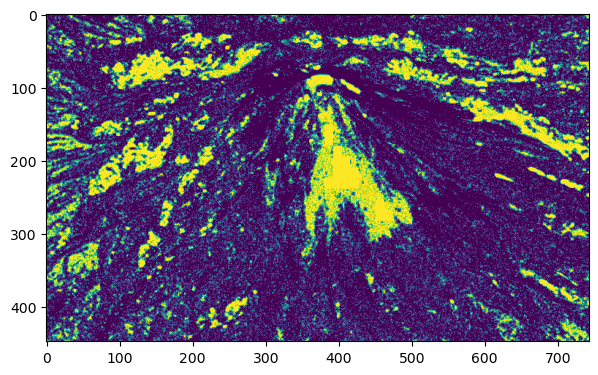

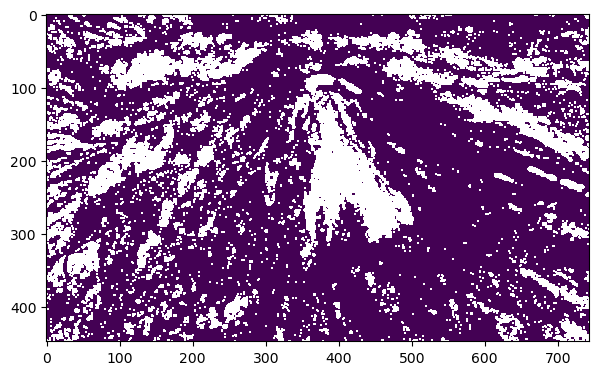

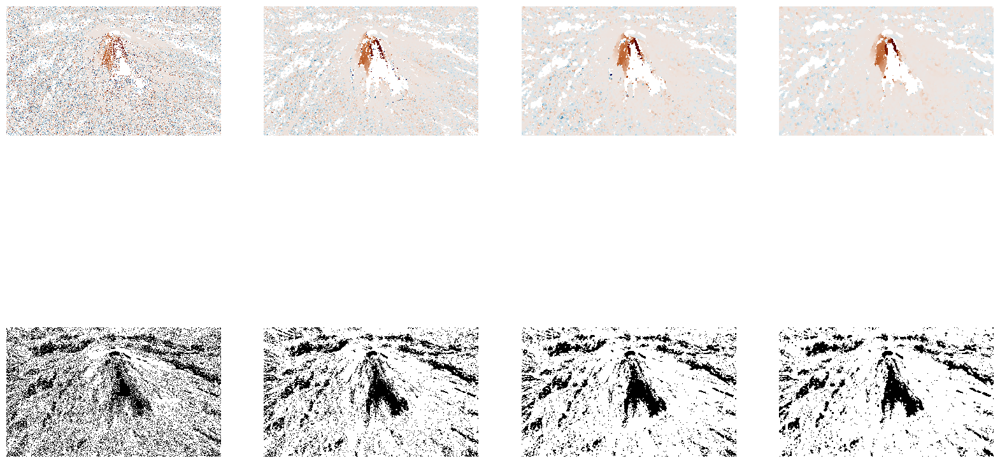

In [16]:
# plot range offset for different window sizes to see nan mask
indeces = [0,2,4,6]
r_offset = np.stack([obj.R_off for obj in datastack.Stack])
plot_data = [r_offset[idx] for idx in indeces]
plot_data = plot_data + [np.isnan(r_offset[idx]) for idx in range(4)]
nan_masks = np.stack([np.isnan(r_offset[idx]) for idx in range(4)])
nan_frac = np.sum(nan_masks, axis=0) / 4

fig=plt.figure(figsize=(7,7))
plt.imshow(nan_frac)
nan_frac2 = copy.deepcopy(nan_frac)
nan_frac2[nan_frac > 0.5] = np.nan
nan_frac2[nan_frac <= 0.5] = 1
fig=plt.figure(figsize=(7,7))
plt.imshow(nan_frac2)

cmaps = [cm.vik,cm.vik,cm.vik,cm.vik,
         'Greys','Greys','Greys','Greys']
min_clim = [-vmax,-vmax,-vmax,-vmax,
            0,0,0,0]

max_clim = [vmax,vmax,vmax,vmax,
            1,1,1,1]


# initiate figure
textsize = 15
plt.rc('font', size=textsize) 
fig=plt.figure(figsize=(20,12))
gs=GridSpec(2,4) # 3 rows, 5 columns
axes = [fig.add_subplot(gs[i,j]) for i in range(2) for j in range(4)]

for ax,p_data,cmap,clim_min,clim_max in zip(axes,plot_data,cmaps,min_clim,max_clim):
    ax.imshow(p_data,cmap=cmap,vmin=clim_min,vmax=clim_max, interpolation='Nearest')
    ax.set_axis_off()

## check outlier detection via confusion matrix

plot for each category and window size:
- number of points in category
- number of points labeled as outlier by HDBSCAN
- number of points labeled as inlier by HDBSCAN

plot confusion matrix of inlier/outlier for each window size


In [ ]:
plt.close('all')

In [17]:

count_list = []
for obj in datastack.Stack:
    r_win = getattr(obj,'R_win')
    a_win = getattr(obj,'A_win')
    r_idx = getattr(obj,'R_idx')
    a_idx = getattr(obj,'A_idx')
    HDBSCAN_labels = getattr(obj,'HDBSCAN_labels')
    test_data = pd.read_csv(f'./test_data/CSK_dsc/{r_win}_{a_win}_test_set.csv',header=0).to_numpy()
    print(test_data)
    counts = np.zeros((4,4))
    counts_in = np.zeros((4,4))
    counts_out = np.zeros((4,4))
    
    for test_vec in test_data:
        # print(test_vec)
        idx = np.argwhere((r_idx==int(test_vec[0]))&(a_idx==int(test_vec[1])))
        print(idx)
        
        counts[int(test_vec[2]),int(test_vec[3])] +=1
        if HDBSCAN_labels[idx[0][0],idx[0][1]]== -1:
            counts_out[int(test_vec[2]),int(test_vec[3])] +=1
        else:
            counts_in[int(test_vec[2]),int(test_vec[3])] +=1
    count_list.append((r_win,a_win,counts,counts_in,counts_out))
print(count_list)

[[3.4560e+03 6.8880e+03 3.0000e+00 0.0000e+00]
 [7.8480e+03 4.6200e+03 0.0000e+00 0.0000e+00]
 [8.9280e+03 6.7440e+03 3.0000e+00 0.0000e+00]
 ...
 [4.4400e+03 5.4600e+03 3.0000e+00 0.0000e+00]
 [1.0776e+04 7.5120e+03 0.0000e+00 0.0000e+00]
 [1.0536e+04 3.0000e+02 1.0000e+00 0.0000e+00]]
[[135 565]]
[[318 376]]
[[363 553]]
[[279 370]]
[[113 732]]
[[354 626]]
[[  6 490]]
[[232 730]]
[[424 338]]
[[ 89 356]]
[[438 163]]
[[129 608]]
[[102 220]]
[[ 13 509]]
[[391 656]]
[[160 705]]
[[43 20]]
[[197  76]]
[[ 47 258]]
[[332 546]]
[[403 485]]
[[296 348]]
[[407 672]]
[[302   8]]
[[445 329]]
[[326 177]]
[[404 573]]
[[201 562]]
[[176 267]]
[[284  57]]
[[173  73]]
[[137 152]]
[[244 326]]
[[67 38]]
[[339 275]]
[[ 72 235]]
[[177  66]]
[[ 10 238]]
[[127 455]]
[[ 46 623]]
[[127  89]]
[[322 122]]
[[350 412]]
[[ 13 441]]
[[116 199]]
[[333  84]]
[[365 367]]
[[ 68 317]]
[[179 482]]
[[105 715]]
[[197 727]]
[[393 419]]
[[230 263]]
[[ 86 258]]
[[346   8]]
[[238  30]]
[[278 604]]
[[151 586]]
[[203 426]]
[[373 27

/var/folders/m9/32v45xkn4zx6js6htb1prb2r0000gn/T/ipykernel_84027/3878871728.py:10: RuntimeWarning: invalid value encountered in divide
  axes[1,idx].imshow(count_in/counts,vmin=0,vmax=1)
/var/folders/m9/32v45xkn4zx6js6htb1prb2r0000gn/T/ipykernel_84027/3878871728.py:12: RuntimeWarning: invalid value encountered in divide
  axes[2,idx].imshow(count_out/counts,vmin=0,vmax=1)


42 20: TP:348.0, FP:128.0, TN:10.0, FN"0.0,
42 20: precission:0.7310924369747899, recall:1.0, f1_score:0.8446601941747572
42 20: precission_out:1.0, recall_out:0.07246376811594203, f1_score_out:0.13513513513513511
74 36: TP:338.0, FP:69.0, TN:10.0, FN"0.0,
74 36: precission:0.8304668304668305, recall:1.0, f1_score:0.9073825503355705
74 36: precission_out:1.0, recall_out:0.12658227848101267, f1_score_out:0.22471910112359553
108 52: TP:491.0, FP:88.0, TN:9.0, FN"0.0,
108 52: precission:0.8480138169257341, recall:1.0, f1_score:0.9177570093457944
108 52: precission_out:1.0, recall_out:0.09278350515463918, f1_score_out:0.16981132075471697
140 68: TP:403.0, FP:79.0, TN:4.0, FN"0.0,
140 68: precission:0.8360995850622407, recall:1.0, f1_score:0.9107344632768362
140 68: precission_out:1.0, recall_out:0.04819277108433735, f1_score_out:0.09195402298850576
174 84: TP:361.0, FP:64.0, TN:0.0, FN"0.0,
174 84: precission:0.8494117647058823, recall:1.0, f1_score:0.9185750636132315
174 84: precission_ou

/var/folders/m9/32v45xkn4zx6js6htb1prb2r0000gn/T/ipykernel_84027/3878871728.py:45: RuntimeWarning: invalid value encountered in double_scalars
  precision_out = TN/(TN + FN)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

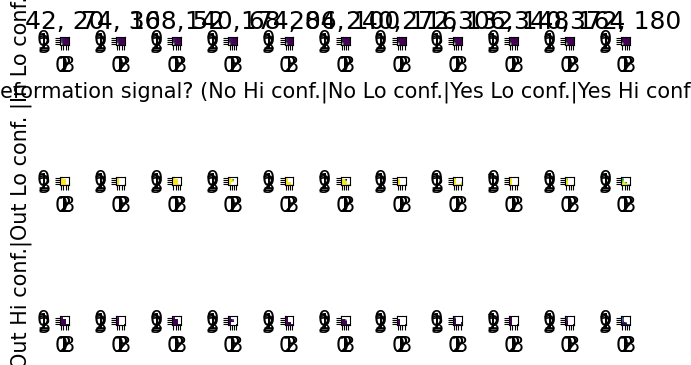

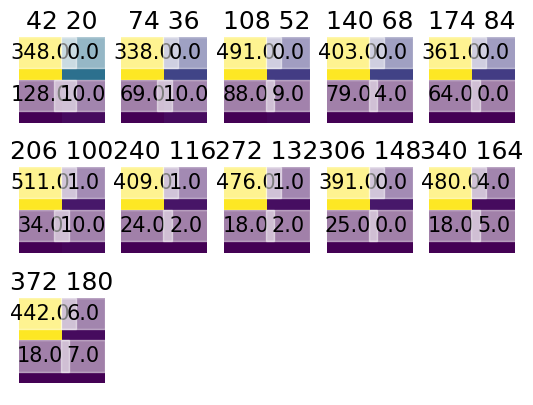

In [18]:
from sklearn import metrics


fig, axes = plt.subplots(3,11)

for idx, (r_win, a_win, counts, count_in,count_out) in enumerate(count_list):
    # print(idx,counts)
    axes[0,idx].imshow(counts)
    axes[0,idx].set_title(f'{r_win}, {a_win}')
    axes[1,idx].imshow(count_in/counts,vmin=0,vmax=1)
    # axes[1,idx].set_title(f'{r_win}, {a_win}')
    axes[2,idx].imshow(count_out/counts,vmin=0,vmax=1)
    # axes[2,idx].set_title(f'{r_win}, {a_win}')
    axes[0,idx].set_xticks([0,1,2,3])
    axes[0,idx].set_yticks([0,1,2,3])
    axes[1,idx].set_xticks([0,1,2,3])
    axes[1,idx].set_yticks([0,1,2,3])
    axes[2,idx].set_xticks([0,1,2,3])
    axes[2,idx].set_yticks([0,1,2,3])
fig.tight_layout()

axes[0,5].set_xlabel('deformation signal? (No Hi conf.|No Lo conf.|Yes Lo conf.|Yes Hi conf.)')
axes[1,0].set_ylabel('[out|in]lier (Out Hi conf.|Out Lo conf. |In Lo conf. |In Hi conf.)')


fig, axes = plt.subplots(3,5)

for idx, ((r_win, a_win, counts, count_in,count_out),ax) in enumerate(zip(count_list,axes.ravel())):

    TP = np.sum(count_in[2:4,:])
    FP = np.sum(count_in[0:2,:])
    FN = np.sum(count_out[2:4,:])
    TN = np.sum(count_out[0:2,:])
    conf_mat = np.reshape([TP, FP,FN, TN],(2,2))
    TPR = TP/(TP+FN)
    FNR = FN/(TP+FN)
    TNR = TN/(TN+FP)
    FPR = FP/(TN+FP)
    precision = TP/(TP+FP)
    recall = TP/(TP+FN)
    F1_score = 2*(precision*recall)/(precision+recall)

    # flipped positive/negative

    precision_out = TN/(TN + FN)
    recall_out = TN/(TN+FP)
    F1_score_out = 2*(precision_out*recall_out)/(precision_out+recall_out)

    print(f'{r_win} {a_win}: TP:{TP}, FP:{FP}, TN:{TN}, FN"{FN},')
    print(f'{r_win} {a_win}: precission:{precision}, recall:{recall}, f1_score:{F1_score}')
    print(f'{r_win} {a_win}: precission_out:{precision_out}, recall_out:{recall_out}, f1_score_out:{F1_score_out}')

    ax.imshow(conf_mat)
    ax.set_title(f'{r_win} {a_win}')
    ax.text(0,0,f'{TP}',ha='center',backgroundcolor=[1,1,1,0.5])
    ax.text(0,1,f'{FP}',ha='center',backgroundcolor=[1,1,1,0.5])
    ax.text(1,0,f'{FN}',ha='center',backgroundcolor=[1,1,1,0.5])
    ax.text(1,1,f'{TN}',ha='center',backgroundcolor=[1,1,1,0.5])

[ax.set_axis_off() for ax in axes.ravel()]


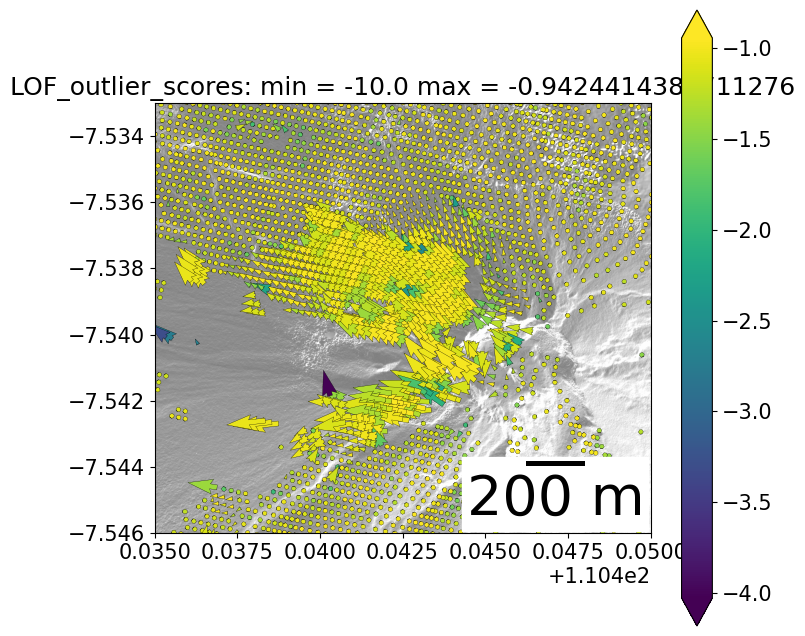

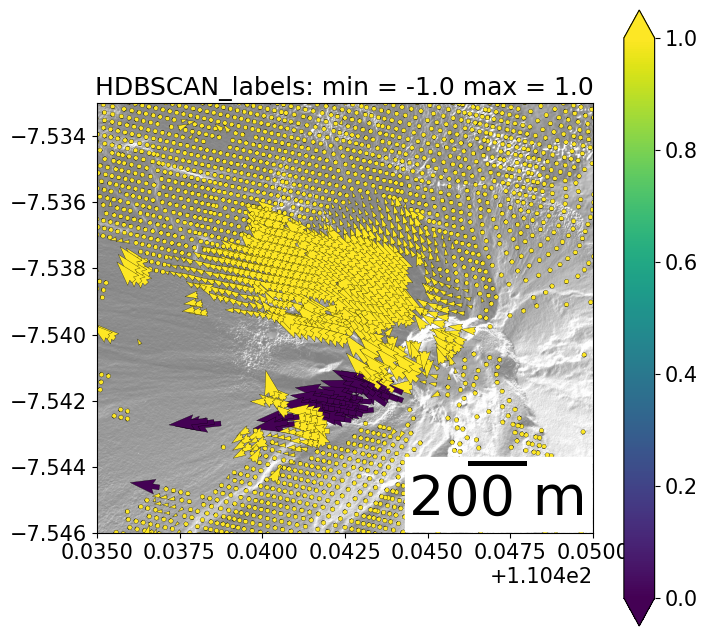

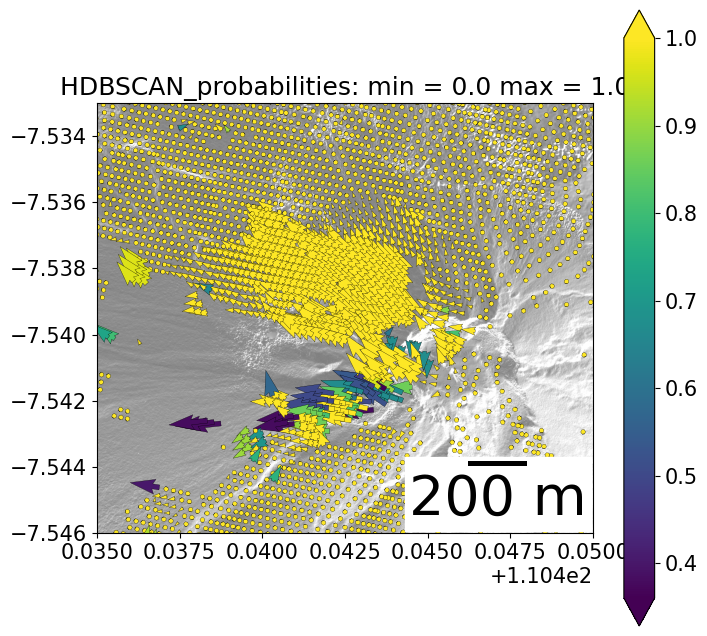

In [19]:
sm.plot.plot_vec_attr(datastack.Stack[6],'LOF_outlier_scores',3,50,0.01,[-10,0],1,SHADING,DEM_EXTENT,[-7.546, -7.533],[110.435,110.450])
sm.plot.plot_vec_attr(datastack.Stack[6],'HDBSCAN_labels',3,50,0.01,[-1,1],1,SHADING,DEM_EXTENT,[-7.546, -7.533],[110.435,110.450])
sm.plot.plot_vec_attr(datastack.Stack[6],'HDBSCAN_probabilities',3,50,0.01,[-1,1],1,SHADING,DEM_EXTENT,[-7.546, -7.533],[110.435,110.450])
# sm.plot.plot_hist(datastack.Stack[6],'LOF_outlier_scores',100)

ValueError: Input contains NaN.

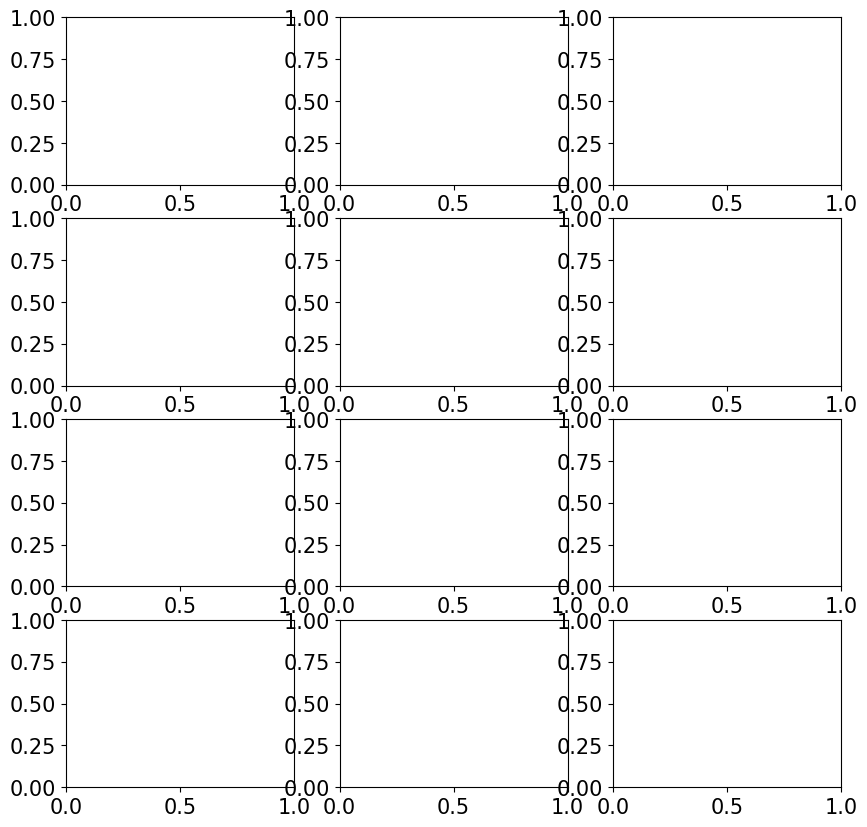

In [20]:
from sklearn import metrics
from matplotlib.collections import LineCollection

fig,axes = plt.subplots(4,3,figsize=(10,10))

count_list = [0,1,2,3,4,5,6,7,8,9,10]
stack_list = [datastack.Stack[idx] for idx in count_list]
for (obj,ax) in zip(stack_list,axes.ravel()):
    r_win = getattr(obj,'R_win')
    a_win = getattr(obj,'A_win')
    r_idx = getattr(obj,'R_idx')
    a_idx = getattr(obj,'A_idx')
    HDBSCAN_labels = getattr(obj,'HDBSCAN_probabilities')
    GLOSH_labels = getattr(obj,'HDBSCAN_outlier_scores')
    LOF_labels = getattr(obj,'LOF_outlier_scores')
    Mag_labels = getattr(obj,'Mag')
    # HDBSCAN_labels[HDBSCAN_labels>1] = 1
    test_data = pd.read_csv(f'./test_data/CSK_dsc/{r_win}_{a_win}_test_set.csv',header=0).to_numpy()
    test_labels = -1 * np.ones(np.shape(test_data[:,1]))
    test_labels[test_data[:,2]>1] = 1

    Mag_test_labels = np.full(np.shape(test_labels),np.nan)
    HDBSCAN_test_labels = np.full(np.shape(test_labels),np.nan)
    GLOSH_test_labels = np.full(np.shape(test_labels),np.nan)
    LOF_test_labels = np.full(np.shape(test_labels),np.nan)
    for row_id, test_vec in enumerate(test_data):
        idx = np.argwhere((r_idx==int(test_vec[0]))&(a_idx==int(test_vec[1])))
        
        Mag_test_labels[row_id] = Mag_labels[idx[0][0],idx[0][1]]
        HDBSCAN_test_labels[row_id] = HDBSCAN_labels[idx[0][0],idx[0][1]]
        GLOSH_test_labels[row_id] = GLOSH_labels[idx[0][0],idx[0][1]]
        LOF_test_labels[row_id] = LOF_labels[idx[0][0],idx[0][1]]

    # checks probability of data belonging to a cluster. outliers have probability 0
    fpr_mag, tpr_mag, thresh_mag = metrics.roc_curve(test_labels,-Mag_test_labels) 
    auc_mag = metrics.roc_auc_score(test_labels,-Mag_test_labels)
    # checks probability of data belonging to a cluster. outliers have probability 0
    fpr_hdb, tpr_hdb, thresh_hdb = metrics.roc_curve(test_labels,HDBSCAN_test_labels) 
    auc_hdb = metrics.roc_auc_score(test_labels,HDBSCAN_test_labels)
    # negative test labels to get outliers as the positive
    fpr_glsh, tpr_glsh, thresh_glsh = metrics.roc_curve(test_labels,1-GLOSH_test_labels)
    auc_glsh = metrics.roc_auc_score(test_labels,1-GLOSH_test_labels)
    # negative test labels to get outliers as the positive, negative LOF score to reverse negative LOF back to LOF to check for outliers
    fpr_lof, tpr_lof, thresh_lof = metrics.roc_curve(test_labels,LOF_test_labels) 
    auc_lof = metrics.roc_auc_score(test_labels,LOF_test_labels)


    ax.plot(fpr_mag,tpr_mag,label=f'mag auc:{auc_mag:1.4f}')
    ax.plot(fpr_hdb,tpr_hdb,label=f'HDBSCAN auc:{auc_hdb:1.4f}')
    ax.plot(fpr_glsh,tpr_glsh,label=f'GLOSH auc:{auc_glsh:1.4f}')
    ax.plot(fpr_lof,tpr_lof,label=f'LOF auc:{auc_lof:1.4f}')
    ax.set_aspect('equal')
    ax.set_axis_off()
    ax.set_ylabel('True Positive Rate')
    ax.set_xlabel('False Positive Rate')
    ax.set_title(f'win size: r:{r_win} a:{a_win}')
    ax.legend()

# axes.ravel()[-1].set_axis_off()
fig.tight_layout()
# print(count_list)

In [ ]:
from sklearn import metrics
from matplotlib.collections import LineCollection

fig,axes = plt.subplots(4,3,figsize=(10,10))

count_list = [0,1,2,3,4,5,6,7,8,9,10]
stack_list = [datastack.Stack[idx] for idx in count_list]
for (obj,ax) in zip(stack_list,axes.ravel()):
    r_win = getattr(obj,'R_win')
    a_win = getattr(obj,'A_win')
    r_idx = getattr(obj,'R_idx')
    a_idx = getattr(obj,'A_idx')
    HDBSCAN_labels = getattr(obj,'HDBSCAN_probabilities')
    GLOSH_labels = getattr(obj,'HDBSCAN_outlier_scores')
    LOF_labels = getattr(obj,'LOF_outlier_scores')
    Mag_labels = getattr(obj,'Mag')
    # HDBSCAN_labels[HDBSCAN_labels>1] = 1
    test_data = pd.read_csv(f'./test_data/CSK_dsc/{r_win}_{a_win}_test_set.csv',header=0).to_numpy()
    test_labels = -1 * np.ones(np.shape(test_data[:,1]))
    test_labels[test_data[:,3]>2] = 1

    Mag_test_labels = np.full(np.shape(test_labels),np.nan)
    HDBSCAN_test_labels = np.full(np.shape(test_labels),np.nan)
    GLOSH_test_labels = np.full(np.shape(test_labels),np.nan)
    LOF_test_labels = np.full(np.shape(test_labels),np.nan)
    for row_id, test_vec in enumerate(test_data):
        idx = np.argwhere((r_idx==int(test_vec[0]))&(a_idx==int(test_vec[1])))
        
        Mag_test_labels[row_id] = Mag_labels[idx[0][0],idx[0][1]]
        HDBSCAN_test_labels[row_id] = HDBSCAN_labels[idx[0][0],idx[0][1]]
        GLOSH_test_labels[row_id] = GLOSH_labels[idx[0][0],idx[0][1]]
        LOF_test_labels[row_id] = LOF_labels[idx[0][0],idx[0][1]]

    # checks probability of data belonging to a cluster. outliers have probability 0
    fpr_mag, tpr_mag, thresh_mag = metrics.roc_curve(test_labels,-Mag_test_labels) 
    auc_mag = metrics.roc_auc_score(test_labels,-Mag_test_labels)
    # checks probability of data belonging to a cluster. outliers have probability 0
    fpr_hdb, tpr_hdb, thresh_hdb = metrics.roc_curve(test_labels,HDBSCAN_test_labels) 
    auc_hdb = metrics.roc_auc_score(test_labels,HDBSCAN_test_labels)
    # negative test labels to get outliers as the positive
    fpr_glsh, tpr_glsh, thresh_glsh = metrics.roc_curve(test_labels,1-GLOSH_test_labels)
    auc_glsh = metrics.roc_auc_score(test_labels,1-GLOSH_test_labels)
    # negative test labels to get outliers as the positive, negative LOF score to reverse negative LOF back to LOF to check for outliers
    fpr_lof, tpr_lof, thresh_lof = metrics.roc_curve(test_labels,LOF_test_labels) 
    auc_lof = metrics.roc_auc_score(test_labels,LOF_test_labels)


    ax.plot(fpr_mag,tpr_mag,label=f'mag auc:{auc_mag:1.4f}')
    ax.plot(fpr_hdb,tpr_hdb,label=f'HDBSCAN auc:{auc_hdb:1.4f}')
    ax.plot(fpr_glsh,tpr_glsh,label=f'GLOSH auc:{auc_glsh:1.4f}')
    ax.plot(fpr_lof,tpr_lof,label=f'LOF auc:{auc_lof:1.4f}')
    ax.set_aspect('equal')
    ax.set_axis_off()
    ax.set_ylabel('True Positive Rate')
    ax.set_xlabel('False Positive Rate')
    ax.set_title(f'win size: r:{r_win} a:{a_win}')
    ax.legend()
    
# axes.ravel()[-1].set_axis_off()
fig.tight_layout()

In [ ]:
plt.close('all')

In [ ]:
IMKA_R_off, MKA_A_off = datastack.Run_MKA([0,2,4,6],comp_lim=0.50)

In [ ]:
MKA_R_off = IMKA_R_off

In [ ]:
from sklearn import linear_model
def Run_RSS(stack_obj,indeces=[],window_size=5,deramp=True):
        # """
        # Calculate residual sum of squares. user can specify window size and can turn off deramping if desired

        # Args:
        #     indices (list, optional): indices of slices from datastack used for MKA. Defaults to [], use all data.
        #     window_size (int, optional): window dimension for MKA, odd numbers 
        #                                  prefered because of pixel centering. 
        #                                  Defaults to 5.
        #     deramp (bool, optional): flag for deramping data in map coordinates 
        #                              to allow for better estimates in gradual displacement 
        #                              fields. deramping in map coordinates does not do local 
        #                              transformation to ortholinear projection so there may 
        #                              be inaccuracies. 
        # Returns:
        #     RSS_list: list of resisual sum of squares
        # """
        # get stack data
        if indeces==[]:
            stack_R = [obj.R_off for obj in stack_obj.Stack]
            stack_A = [obj.A_off for obj in stack_obj.Stack]
            stack_lons = [getattr(obj,'Lon_off') for obj in stack_obj.Stack]
            stack_lats = [getattr(obj,'Lat_off') for obj in stack_obj.Stack]

        else:
            substack = [stack_obj.Stack[i] for i in indeces]
            stack_R = np.stack([obj.R_off for obj in substack],axis=0)
            stack_A = np.stack([obj.A_off for obj in substack],axis=0)
            stack_lons = np.stack([getattr(obj,'Lon_off') for obj in substack])
            stack_lats = np.stack([getattr(obj,'Lat_off') for obj in substack])

        # create list of rss values
        rss_list = []

        for stack_r,stack_a,stack_lon,stack_lat in zip(stack_R,stack_A,stack_lons,stack_lats):
            # set window size according to stack dimensions
            window_shape = (window_size, window_size)
            print(np.shape(window_shape))
            # use np.lib.stride_tricks.sliding_window_view to devided data into windows
            # 1.2xfaster than sklearn view_as_windows
            win_data_r = np.lib.stride_tricks.sliding_window_view(stack_r, window_shape)
            win_data_a = np.lib.stride_tricks.sliding_window_view(stack_a, window_shape)

            win_data_lon = np.lib.stride_tricks.sliding_window_view(stack_lon, window_shape)
            win_data_lat = np.lib.stride_tricks.sliding_window_view(stack_lat, window_shape)
            
            # define shape of multi-kernel averaged map (same as input data), filled with nan
            Avg_map_r = []
            Avg_map_a = []



            # per window, go take 95% confidence interval data and take average (mean)
            for win_i in range(win_data_r.shape[0]):
                if win_i % 5 == 0:
                    print('win_i', win_i)
                for win_j in range(win_data_r.shape[1]):
                    # extract relevant window
                    win_rng = np.array(win_data_r[win_i, win_j])
                    win_azi = np.array(win_data_a[win_i, win_j])
                    
                    lon_win = np.array(win_data_lon[win_i,win_j])
                    lat_win = np.array(win_data_lat[win_i,win_j])
                    # print(win_rng,win_azi,lon_win,lat_win)
                    # calculate 95 % confidence interval
                    percentiles_r = np.nanpercentile(win_rng, [2.5, 97.5])
                    percentiles_a = np.nanpercentile(win_azi, [2.5, 97.5])
                    # mask data outside 95% confidence interval with nan
                    mask_r = (win_rng < percentiles_r[0]) | (win_rng > percentiles_r[1])
                    mask_a = (win_azi < percentiles_a[0]) | (win_azi > percentiles_a[1])
                    mask = (mask_r) | (mask_a)
                    # print(mask)
                    win_rng[mask] = np.nan
                    win_azi[mask] = np.nan
                    lon_win[mask] = np.nan
                    lat_win[mask] = np.nan
                    
                    #deramp
                    if np.all(np.isnan(win_rng)):
                        deramped_r = np.nan
                        deramped_a = np.nan
                    else:
                        if deramp:
                            X_data = np.transpose(np.stack((lon_win.flatten(),lat_win.flatten())))
                            Y_data_r = win_rng.flatten()
                            X_data = X_data[np.where(~np.isnan(Y_data_r))]
                            Y_data_r = Y_data_r[np.where(~np.isnan(Y_data_r))]
                            reg = linear_model.LinearRegression().fit(X_data, Y_data_r)
                            deramped_r =win_rng.flatten() - lon_win.flatten() * reg.coef_[0] - lat_win.flatten() * reg.coef_[1]

                            Y_data_a = win_azi.flatten()
                            Y_data_a = Y_data_a[np.where(~np.isnan(Y_data_a))]
                            reg = linear_model.LinearRegression().fit(X_data, Y_data_a)
                            deramped_a =win_azi.flatten() - lon_win.flatten() * reg.coef_[0] - lat_win.flatten() * reg.coef_[1]
                        else:
                            deramped_r = win_rng.flatten()
                            deramped_a = win_azi.flatten()
                    # remove -1 entries (all nans)
                    # deramped_a[deramped_a==-1] = np.nan
                    # deramped_r[deramped_r==-1] = np.nan
            
                    # calculate mean of window (offset by floor(window_size/2) because of border)
                    Avg_map_r.append(np.nanstd(deramped_r)**2)
                    Avg_map_a.append(np.nanstd(deramped_a)**2)
                    
                    rss = (np.sum(Avg_map_r),np.sum(Avg_map_a))
            rss_list.append(rss)
        stack_obj.Rss_list = rss_list

        return stack_obj.Rss_list

In [ ]:
from sklearn import linear_model
import numpy as np

def Run_RSS(stack_obj, indices=[], window_size=5, deramp=True):
    # Get stack data
    if indices == []:
        stack_R = [obj.R_off for obj in stack_obj.Stack]
        stack_A = [obj.A_off for obj in stack_obj.Stack]
        stack_lons = [getattr(obj, 'Lon_off') for obj in stack_obj.Stack]
        stack_lats = [getattr(obj, 'Lat_off') for obj in stack_obj.Stack]
    else:
        substack = [stack_obj.Stack[i] for i in indices]
        stack_R = np.stack([obj.R_off for obj in substack], axis=0)
        stack_A = np.stack([obj.A_off for obj in substack], axis=0)
        stack_lons = np.stack([getattr(obj, 'Lon_off') for obj in substack])
        stack_lats = np.stack([getattr(obj, 'Lat_off') for obj in substack])

    rss_list = []

    for stack_r, stack_a, stack_lon, stack_lat in zip(stack_R, stack_A, stack_lons, stack_lats):
        # Set window size according to stack dimensions
        window_shape = (window_size, window_size)

        # Use np.lib.stride_tricks.sliding_window_view to divide data into windows
        win_data_r = np.lib.stride_tricks.sliding_window_view(stack_r, window_shape)
        win_data_a = np.lib.stride_tricks.sliding_window_view(stack_a, window_shape)
        win_data_lon = np.lib.stride_tricks.sliding_window_view(stack_lon, window_shape)
        win_data_lat = np.lib.stride_tricks.sliding_window_view(stack_lat, window_shape)

        # Define shape of multi-kernel averaged map (same as input data), filled with nan
        Avg_map_r = np.empty(win_data_r.shape[:-2])
        Avg_map_a = np.empty(win_data_a.shape[:-2])

        # Per window, calculate RSS
        for win_i in range(win_data_r.shape[0]):
            if win_i % 5 == 0:
                    print('win_i', win_i)
            for win_j in range(win_data_r.shape[1]):
                win_rng = np.array(win_data_r[win_i, win_j])
                win_azi = np.array(win_data_a[win_i, win_j])
                lon_win = np.array(win_data_lon[win_i, win_j])
                lat_win = np.array(win_data_lat[win_i, win_j])

                # Calculate 95% confidence interval
                percentiles_r = np.nanpercentile(win_rng, [2.5, 97.5])
                percentiles_a = np.nanpercentile(win_azi, [2.5, 97.5])

                # Create mask for values outside confidence interval
                mask_r = (win_rng < percentiles_r[0]) | (win_rng > percentiles_r[1])
                mask_a = (win_azi < percentiles_a[0]) | (win_azi > percentiles_a[1])
                mask = (mask_r) |(mask_a)
                # Mask data outside confidence interval with nan
                win_rng[mask] = np.nan
                win_azi[mask] = np.nan
                lon_win[mask] = np.nan
                lat_win[mask] = np.nan

                if deramp and not np.all(np.isnan(win_rng)):
                    # Deramp data
                    X_data = np.column_stack((lon_win.flatten(), lat_win.flatten()))
                    Y_data_r = win_rng.flatten()
                    Y_data_a = win_azi.flatten()

                    valid_mask_r = ~np.isnan(Y_data_r)
                    valid_mask_a = ~np.isnan(Y_data_a)

                    X_data_r = X_data[valid_mask_r]
                    Y_data_r = Y_data_r[valid_mask_r]

                    X_data_a = X_data[valid_mask_a]
                    Y_data_a = Y_data_a[valid_mask_a]

                    reg_r = linear_model.LinearRegression().fit(X_data_r, Y_data_r)
                    deramped_r = win_rng.flatten() - lon_win.flatten() * reg_r.coef_[0] - lat_win.flatten() * reg_r.coef_[1]

                    reg_a = linear_model.LinearRegression().fit(X_data_a, Y_data_a)
                    deramped_a = win_azi.flatten() - lon_win.flatten() * reg_a.coef_[0] - lat_win.flatten() * reg_a.coef_[1]
                else:
                    deramped_r = win_rng.flatten()
                    deramped_a = win_azi.flatten()

                # Calculate mean of window (offset by floor(window_size/2) because of border)
                np.append(Avg_map_r,np.nanstd(deramped_r)**2)
                np.append(Avg_map_a,np.nanstd(deramped_a)**2)


        rss = (np.sum(Avg_map_r), np.sum(Avg_map_a))
        rss_list.append(rss)

    stack_obj.Rss_list = rss_list
    return stack_obj.Rss_list


In [ ]:
from sklearn import linear_model
import numpy as np

def Run_RSS(stack_obj, indices= [], window_size=5, deramp=True):
    # Get stack data
    if indices == []:
        stack_R = [obj.R_off for obj in stack_obj.Stack]
        stack_A = [obj.A_off for obj in stack_obj.Stack]
        stack_lons = [getattr(obj, 'Lon_off') for obj in stack_obj.Stack]
        stack_lats = [getattr(obj, 'Lat_off') for obj in stack_obj.Stack]
    else:
        substack = [stack_obj.Stack[i] for i in indices]
        stack_R = np.stack([obj.R_off for obj in substack], axis=0)
        stack_A = np.stack([obj.A_off for obj in substack], axis=0)
        stack_lons = np.stack([getattr(obj, 'Lon_off') for obj in substack])
        stack_lats = np.stack([getattr(obj, 'Lat_off') for obj in substack])

    rss_list = []

    for stack_r, stack_a, stack_lon, stack_lat in zip(stack_R, stack_A, stack_lons, stack_lats):
        # Set window size according to stack dimensions
        window_shape = (window_size, window_size)

        # Use np.lib.stride_tricks.sliding_window_view to divide data into windows
        win_data_r = np.array(np.lib.stride_tricks.sliding_window_view(stack_r, window_shape))
        win_data_a = np.array(np.lib.stride_tricks.sliding_window_view(stack_a, window_shape))
        win_data_lon = np.array(np.lib.stride_tricks.sliding_window_view(stack_lon, window_shape))
        win_data_lat = np.array(np.lib.stride_tricks.sliding_window_view(stack_lat, window_shape))

        # Calculate 95% confidence intervals
        percentiles_r = np.nanpercentile(win_data_r, [2.5, 97.5], axis=(2, 3), keepdims=True)
        percentiles_a = np.nanpercentile(win_data_a, [2.5, 97.5], axis=(2, 3), keepdims=True)

        # Create masks for values outside confidence intervals
        mask_r = (win_data_r < percentiles_r[0]) | (win_data_r > percentiles_r[1])
        mask_a = (win_data_a < percentiles_a[0]) | (win_data_a > percentiles_a[1])
        mask = (mask_r) | (mask_a)
        # Mask data outside confidence intervals with nan
        win_data_r[mask] = np.nan
        win_data_a[mask] = np.nan
        win_data_lon[mask] = np.nan
        win_data_lat[mask] = np.nan

        if deramp:
            # Deramp data
            X_data = np.column_stack((win_data_lon.flatten(), win_data_lat.flatten()))
            Y_data_r = win_data_r.flatten()
            Y_data_a = win_data_a.flatten()

            valid_mask = ~np.isnan(Y_data_r)

            X_data = X_data[valid_mask]
            Y_data_r = Y_data_r[valid_mask]
            Y_data_a = Y_data_a[valid_mask]

            reg_r = linear_model.LinearRegression().fit(X_data, Y_data_r)
            reg_a = linear_model.LinearRegression().fit(X_data, Y_data_a)

            deramped_r = Y_data_r - np.dot(X_data, reg_r.coef_)
            deramped_a = Y_data_a - np.dot(X_data, reg_a.coef_)
        else:
            deramped_r = win_data_r.flatten()
            deramped_a = win_data_a.flatten()

        # Calculate mean of window (offset by floor(window_size/2) because of border)
        avg_map_r = np.nanstd(deramped_r)**2
        avg_map_a = np.nanstd(deramped_a)**2

        rss_list.append((np.sum(avg_map_r), np.sum(avg_map_a)))

    stack_obj.Rss_list = rss_list
    return stack_obj.Rss_list


In [ ]:
rss_list = Run_RSS(datastack,[],5,True)

In [ ]:
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1 import make_axes_locatable # for colorbar scaling
from cmcrameri import cm

idx_for_plot = [0,2,4,6]
map_extent = [0,446,150,550]
zoom_extent = [140,240,310,390]

substack = [datastack.Stack[i] for i in idx_for_plot]
stack_R = np.stack([obj.R_off for obj in substack],axis=0)
stack_A = np.stack([obj.A_off for obj in substack],axis=0)

plot_data = [stack_R[idx][map_extent[0]:map_extent[1],map_extent[2]:map_extent[3]] for idx in range(len(idx_for_plot))]
plot_data.append(MKA_R_off[map_extent[0]:map_extent[1],map_extent[2]:map_extent[3]])
plot_data = plot_data + [stack_R[idx][zoom_extent[0]:zoom_extent[1],zoom_extent[2]:zoom_extent[3]] for idx in range(len(idx_for_plot))]
plot_data.append(MKA_R_off[zoom_extent[0]:zoom_extent[1],zoom_extent[2]:zoom_extent[3]])
plot_data = plot_data + [np.isnan(stack_R[idx][zoom_extent[0]:zoom_extent[1],zoom_extent[2]:zoom_extent[3]]) for idx in range(len(idx_for_plot))]
plot_data.append(np.isnan(MKA_R_off)[zoom_extent[0]:zoom_extent[1],zoom_extent[2]:zoom_extent[3]])

cmaps = [cm.vik,cm.vik,cm.vik,cm.vik,cm.vik,
         cm.vik,cm.vik,cm.vik,cm.vik,cm.vik,
         'Greys','Greys','Greys','Greys','Greys',]
min_clim = [-vmax,-vmax,-vmax,-vmax,-vmax,
            -vmax,-vmax,-vmax,-vmax,-vmax,
            0,0,0,0,0,]

max_clim = [vmax,vmax,vmax,vmax,vmax,
            vmax,vmax,vmax,vmax,vmax,
            1,1,1,1,1,]
all_data_arrays2 = [datastack.Stack[idx] for idx in idx_for_plot]
win_sizes = [str(data.get_window_size()) for data in all_data_arrays2]
win_sizes = win_sizes + ['multi-kernel \naverage']


# initiate figure
textsize = 28
plt.rc('font', size=textsize) 
fig=plt.figure(figsize=(10,10))
gs=GridSpec(3,6) # 3 rows, 5 columns
axes = [fig.add_subplot(gs[i,j]) for i in range(3) for j in range(5)]

for ax,p_data,cmap,clim_min,clim_max in zip(axes,plot_data,cmaps,min_clim,max_clim):
    ax.imshow(p_data,cmap=cmap,vmin=clim_min,vmax=clim_max, interpolation='Nearest')
    ax.set_axis_off()
    
for ax,win_size in zip(axes[0:5],win_sizes):
    ax.add_patch(plt.Rectangle((zoom_extent[2]-map_extent[2], zoom_extent[0]-map_extent[0]), zoom_extent[3]-zoom_extent[2], zoom_extent[1]-zoom_extent[0], ls="-", ec="k", fc="none",
                           ))
    ax.set_title(win_size)

fig.tight_layout()
cbar_pos = axes[4].get_position()
 
cax = plt.axes([cbar_pos.x0+cbar_pos.width + 0.1, cbar_pos.y0-0.08, 0.01, 2 * cbar_pos.height])      
mappable = plt.cm.ScalarMappable(cmap = cm.vik,
                                 norm = plt.Normalize(vmin = -vmax, vmax = vmax))
cbar = fig.colorbar(mappable, cax, orientation = 'vertical')
cbar.set_label('Slant range \noffset [m]', rotation=90, loc= 'center',labelpad=0)

# for ax in axes[0:5]:
#     ax.annotate('slant range',xy=(50,50),xytext=(0,-50),textcoords='offset pixels', xycoords='data',
#                     arrowprops=dict(facecolor='black',arrowstyle='<-'),horizontalalignment='center',verticalalignment='top',rotation=90)
#     ax.annotate('azimuth',xy=(50,50),xytext=(50,0),textcoords='offset pixels' ,xycoords='data',
#                     arrowprops=dict(facecolor='black',arrowstyle='<-'),horizontalalignment='left',verticalalignment='center')
textsize = 24
plt.rc('font', size=textsize) 
for ax in axes[-10:-5]:
    ax.annotate('slant range',xy=(5,5),xytext=(0,-50),textcoords='offset pixels', xycoords='data',
                    arrowprops=dict(facecolor='black',arrowstyle='<-',lw=3),horizontalalignment='center',verticalalignment='top',rotation=90)
    ax.annotate('azimuth',xy=(5,5),xytext=(50,0),textcoords='offset pixels' ,xycoords='data',
                    arrowprops=dict(facecolor='black',arrowstyle='<-',lw=3),horizontalalignment='left',verticalalignment='center')

# fig.tight_layout()
fig.subplots_adjust(hspace=0.05)


In [ ]:
plt.close('all')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap
import rasterio as rio
import fiona
import geopandas as gpd

import json
from shapely.geometry import Point, LineString, mapping
from functools import partial
from shapely.ops import transform


# get NDVI data
file_name = '../Merapi2021/sentinel2/S2A_MSIL2A_20200821T023551_N0214_R089_T49MDM_20200821T064209.SAFE/GRANULE/L2A_T49MDM_A026970_20200821T025827/IMG_DATA/R10m/T49MDM_20200821T023551_NDVI_10m_WGS84.tif'
# with rio.open(file_name) as src:
#     band1 = src.read(1)
#     print('Band1 has shape', band1.shape)
#     height = band1.shape[0]
#     width = band1.shape[1]
#     cols, rows = np.meshgrid(np.arange(width), np.arange(height))
#     xs, ys = rio.transform.xy(src.transform, rows, cols)
#     ndvi_lons = np.array(xs)
#     ndvi_lats = np.array(ys)
#     ndvi_extent = [src.bounds.left,src.bounds.right,src.bounds.bottom,src.bounds.top]


# define map region of interest
lon_lims = [np.nanmin(lon_off_compare), np.nanmax(lon_off_compare)]
lat_lims = [np.nanmin(lat_off_compare), np.nanmax(lat_off_compare)]
crop_flag=1

# create cropping polygon from ROI
if crop_flag:
    coords = ((lon_lims[0], lat_lims[0]), (lon_lims[0], lat_lims[1]), (lon_lims[1], lat_lims[1]), (lon_lims[1], lat_lims[0]), (lon_lims[0], lat_lims[0]))
    crop_poly = Polygon(coords)
    crop_poly_geojson = gpd.GeoSeries([crop_poly])
    crop_poly_geojson.to_file('./test_data/test_variability_roi.shp',crs="EPSG:4326")

with fiona.open('./test_data/test_variability_roi.shp', "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

# get data and read coords from first file
with rio.open(file_name) as src:
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True)
    out_meta = src.meta
    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})
with rasterio.open("./test_Data/ndvi_cropped.tif", "w", **out_meta) as dest:
    dest.write(out_image)



with rio.open("./test_Data/ndvi_cropped.tif") as src:
    ndvi_map = src.read(1)
    print('Band1 has shape', ndvi_map.shape)
    height = ndvi_map.shape[0]
    width = ndvi_map.shape[1]
    cols, rows = np.meshgrid(np.arange(width), np.arange(height))
    xs, ys = rio.transform.xy(src.transform, rows, cols)
    ndvi_lons = np.array(xs)
    ndvi_lats = np.array(ys)
    ndvi_extent = [src.bounds.left,src.bounds.right,src.bounds.bottom,src.bounds.top]


x= cm.get_cmap('Blues_r', 135)
y= cm.get_cmap('YlGn', 135)
z = np.vstack((x(range(135)), y(range(135))))
ndvi_cmap = ListedColormap(z, name='BlYlGn')

In [ ]:
# %matplotlib osx

# fig, ax = plt.subplots(1,1,figsize=(10,10))
# ax.imshow(ndvi_map,cmap=ndvi_cmap,extent=ndvi_extent,vmin=-1,vmax=1)

In [ ]:
# test query point

# query points
q1 = [110.446216,-7.536389] # stable no veg north
q2 = [110.42647,-7.53297] # stable veg north west
q3 = [110.4421429,-7.5377992] # L1888
q4 = [110.44214,-7.54237] # L1998 large disp
q5 = [110.44013,-7.54678] # stable no veg south
q6 = [110.44200,-7.53604] # L1956 offset gradient
query_points = np.stack((q1,q2,q3,q4,q5,q6))

r = 50 # radius of 5 meters around point


# original window size 108-52
orig_q_mean, orig_q_median, orig_q_std, orig_q_95, coordinate_circles = sm.Post_processing.query_point(lat_off_compare.flatten(),
                                                               lon_off_compare.flatten(),
                                                               R_off_compare.flatten(),
                                                               query_points[:,1],
                                                               query_points[:,0],
                                                               r)
print('\n')
print(f'Range mean for A, B, C: {orig_q_mean}')
print(f'Range median for A, B, C: {orig_q_median}')
print(f'Range standard deviation for A, B, C: {orig_q_std}')
print(f'Range 95\% confidence interval fro A, B, C: {orig_q_95}')

# MKA reuslt
MKA_q_mean, MKA_q_median, MKA_q_std, MKA_q_95, coordinate_circles = sm.Post_processing.query_point(lat_off_compare.flatten(),
                                                               lon_off_compare.flatten(),
                                                               MKA_R_off.flatten(),
                                                               query_points[:,1],
                                                               query_points[:,0],
                                                               r)
print('\n')
print(f'Range mean for A, B, C: {MKA_q_mean}')
print(f'Range median for A, B, C: {MKA_q_median}')
print(f'Range standard deviation for A, B, C: {MKA_q_std}')
print(f'Range 95\% confidence interval fro A, B, C: {MKA_q_95}')

# original window size 108-52 azimuth
orig_q_mean, orig_q_median, orig_q_std, orig_q_95, coordinate_circles = sm.Post_processing.query_point(lat_off_compare.flatten(),
                                                               lon_off_compare.flatten(),
                                                               A_off_compare.flatten(),
                                                               query_points[:,1],
                                                               query_points[:,0],
                                                               r)
print('\n')
print(f'Azimuth mean for A, B, C: {orig_q_mean}')
print(f'Azimuth median for A, B, C: {orig_q_median}')
print(f'Azimuth standard deviation for A, B, C: {orig_q_std}')
print(f'Azimuth 95\% confidence interval fro A, B, C: {orig_q_95}')

# MKA reuslt
MKA_q_mean, MKA_q_median, MKA_q_std, MKA_q_95, coordinate_circles = sm.Post_processing.query_point(lat_off_compare.flatten(),
                                                               lon_off_compare.flatten(),
                                                               MKA_A_off.flatten(),
                                                               query_points[:,1],
                                                               query_points[:,0],
                                                               r)
print('\n')
print(f'Azimuth mean for A, B, C: {MKA_q_mean}')
print(f'Azimuth median for A, B, C: {MKA_q_median}')
print(f'Azimuth standard deviation for A, B, C: {MKA_q_std}')
print(f'Azimuth 95\% confidence interval fro A, B, C: {MKA_q_95}')


# NDVI reuslt
ndvi_q_mean, ndvi_q_median, ndvi_q_std, ndvi_q_95, coordinate_circles = sm.Post_processing.query_point(ndvi_lats.flatten(),
                                                               ndvi_lons.flatten(),
                                                               ndvi_map.flatten(),
                                                               query_points[:,1],
                                                               query_points[:,0],
                                                               r)
print('\n')
print(f'mean for A, B, C: {ndvi_q_mean}')
print(f'median for A, B, C: {ndvi_q_median}')
print(f'standard deviation for A, B, C: {ndvi_q_std}')
print(f'95\% confidence interval fro A, B, C: {ndvi_q_95}')

In [ ]:
indeces = [0,2,4,6]
# stats_list, coordinate_circles = datastack.query_point_stack('A_off_vec',
#                                                              query_points[:,1],
#                                                              query_points[:,0],
#                                                              r,
#                                                              indeces)

[q_mean_MKA, q_median_MKA, q_std_MKA, q_95_MKA], coordinate_circles = datastack.query_point_MKA('MKA_A_off',
                                                                                                 query_points[:,1],
                                                                                                 query_points[:,0],
                                                                                                 r)                                                        

In [ ]:
print(stats_list)
# print(q_mean_MKA, q_median_MKA, q_std_MKA, q_95_MKA)
print(MKA_q_mean, MKA_q_median, MKA_q_std, MKA_q_95)

In [ ]:
plt.close ('all')

In [88]:
## calculate inter window sum of differences

wins_1 = [datastack.Stack[i] for i in range(np.size(datastack.Stack[i])-1)]
wins_2 = [datastack.Stack[i+1] for i in range(np.size(datastack.Stack[i])-1)]

R_diff = []
A_diff = []

for (win1,win2) in zip(wins_1,wins_2):
    R_off_1 = getattr(win1,'R_off')
    R_off_2 = getattr(win2,'R_off')

    A_off_1 = getattr(win1,'A_off')
    A_off_2 = getattr(win2,'A_off')

    R_diff.append(np.sum(np.abs(R_off_2-R_off_1)))
    A_diff.append(np.sum(np.abs(A_off_2-A_off_1)))

print(R_diff)
print(A_diff)
print(R_diff + A_diff)
    

    

1   HIToolbox                           0x00007ff81d14352b _ZN15MenuBarInstance21IsAutoShowHideAllowedEv + 259
2   HIToolbox                           0x00007ff81d03c33e _ZN15MenuBarInstance24UpdateAutoShowVisibilityE5Pointh + 34
3   HIToolbox                           0x00007ff81cfab81f _ZN15MenuBarInstance16ForEachMenuBarDoEU13block_pointerFvPS_E + 169
4   HIToolbox                           0x00007ff81d03c93d _ZN15MenuBarInstance20AutoShowHideObserverEjP14OpaqueEventRefPv + 165
5   HIToolbox                           0x00007ff81cfa2bd2 _NotifyEventLoopObservers + 153
6   HIToolbox                           0x00007ff81cfd4fb8 PostEventToQueueInternal + 700
7   HIToolbox                           0x00007ff81cfd6871 _ZL29CreateAndPostEventWithCGEventP9__CGEventjhP17__CFMachPortBoost + 404
8   HIToolbox                           0x00007ff81cfe2ee9 _ZL15Convert1CGEventh + 246
9   HIToolbox                           0x00007ff81cfe2d91 _ZL16MainLoopObserverjP14OpaqueEventRefPv + 41
10  HIT

In [ ]:
# make plot for comparison
# 1 original input mid window size
# 2 outlier removed-mka result
# 3 ndvi
from cmcrameri import cm
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter

data2plot = [R_off_compare,MKA_R_off,ndvi_map]
lon2plot = [lon_off_compare,lon_off_compare,ndvi_lons]
lat2plot = [lat_off_compare,lat_off_compare,ndvi_lats]
cmaps = [cm.vik,cm.vik,ndvi_cmap]
vmins = [-3,-3,-1]
vmaxs = [3,3,1]
cbar_labels = ['Slant range\noffset [m]', 'Slant range\noffset [m]', 'NDVI [-]']
lon_lims = [110.42, 110.45]
lat_lims = [-7.55, -7.53]
# q1 = [110.446216,-7.536389]
# q2 = [110.427882,-7.530558]
# q3 = [110.4421429,-7.5377992]

distance_meters = sm.plot.get_1deg_dist()


fig, ax = plt.subplots(3,1,figsize=(4,12))
for i,(data,lon_p,lat_p,cmap,vmin,vmax,cbar_label) in enumerate(zip(data2plot,lon2plot,lat2plot,cmaps,vmins,vmaxs,cbar_labels)):
    plot_extent = [np.nanmin(lon_p),np.nanmax(lon_p),np.nanmin(lat_p),np.nanmax(lat_p)]
    plot_data = ax[i].hexbin(lon_p.flatten(),lat_p.flatten(),C=data.flatten(),gridsize=500,cmap=cmap,vmin=vmin,vmax=vmax)
    ax[i].plot(coordinate_circles[0][:,0],coordinate_circles[0][:,1],color='Black',linewidth=3)
    ax[i].plot(coordinate_circles[1][:,0],coordinate_circles[1][:,1],color='Black',linewidth=3)
    ax[i].plot(coordinate_circles[2][:,0],coordinate_circles[2][:,1],color='Black',linewidth=3)
    ax[i].plot(coordinate_circles[3][:,0],coordinate_circles[3][:,1],color='Black',linewidth=3)
    ax[i].plot(coordinate_circles[4][:,0],coordinate_circles[4][:,1],color='Black',linewidth=3)
    ax[i].plot(coordinate_circles[5][:,0],coordinate_circles[5][:,1],color='Black',linewidth=3)
    ax[i].set_xlim(lon_lims)
    ax[i].set_ylim(lat_lims)
    ax[i].set_aspect('equal', 'box')
    ax[i].add_artist(ScaleBar(distance_meters,location='lower left'))
    ax[i].set_axis_off()
    cbar = plt.colorbar(plot_data,ax=ax[i])
    cbar.set_label(cbar_label)

/Applications/anaconda3/envs/PhD/lib/python3.8/site-packages/numpy/core/_methods.py:180: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


1   HIToolbox                           0x00007ff81d03c726 _ZN15MenuBarInstance22EnsureAutoShowObserverEv + 102
2   HIToolbox                           0x00007ff81cfabce3 _ZN15MenuBarInstance21UpdateAggregateUIModeE21MenuBarAnimationStylehhh + 1125
3   HIToolbox                           0x00007ff81d03c173 _ZN15MenuBarInstance19SetFullScreenUIModeEjj + 175
4   AppKit                              0x00007ff816b09287 -[NSApplication _setPresentationOptions:instance:flags:] + 1145
5   AppKit                              0x00007ff81695e055 -[NSApplication _updateFullScreenPresentationOptionsForInstance:] + 582
6   AppKit                              0x00007ff8173ac7f0 -[_NSFullScreenSpace(PresentationInstance) activateFullScreenPresentationOptions] + 207
7   AppKit                              0x00007ff8171ff5d8 -[_NSEnterFullScreenTransitionController _doSucceededToEnterFullScreen] + 721
8   AppKit                              0x00007ff8172000e7 __65-[_NSEnterFullScreenTransitionController

In [ ]:
# make plot for comparison
# 1 original input mid window size
# 2 outlier removed-mka result
# 3 ndvi
from cmcrameri import cm
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import FormatStrFormatter

data2plot = [R_off_compare,MKA_A_off]
lon2plot = [lon_off_compare,lon_off_compare,lon_off_compare,lon_off_compare]
lat2plot = [lat_off_compare,lat_off_compare,lon_off_compare,lon_off_compare]
cmaps = [cm.vik,cm.vik,cm.vik,cm.vik]
vmins = [-3,-3,-3,-3]
vmaxs = [3,3,3,3]
cbar_labels = ['Slant range\noffset [m]', 'Azimuth\noffset [m]', 'Slant range\noffset [m]', 'Azimuth\noffset [m]',]
lon_lims = [110.42, 110.45]
lat_lims = [-7.55, -7.53]
# q1 = [110.446216,-7.536389]
# q2 = [110.427882,-7.530558]
# q3 = [110.4421429,-7.5377992]

distance_meters = sm.plot.get_1deg_dist()


fig, ax = plt.subplots(2,2,figsize=(12,12))

for (i,j,data,lon_p,lat_p,cmap,vmin,vmax,cbar_label) in zip([0,0,1,1],[0,1,0,1],data2plot,lon2plot,lat2plot,cmaps,vmins,vmaxs,cbar_labels):
    plot_extent = [np.nanmin(lon_p),np.nanmax(lon_p),np.nanmin(lat_p),np.nanmax(lat_p)]
    plot_data = ax[i,j].hexbin(lon_p.flatten(),lat_p.flatten(),C=data.flatten(),gridsize=500,cmap=cmap,vmin=vmin,vmax=vmax)
    # ax[i].plot(coordinate_circles[0][:,0],coordinate_circles[0][:,1],color='Black',linewidth=3)
    # ax[i].plot(coordinate_circles[1][:,0],coordinate_circles[1][:,1],color='Black',linewidth=3)
    # ax[i].plot(coordinate_circles[2][:,0],coordinate_circles[2][:,1],color='Black',linewidth=3)
    # ax[i].plot(coordinate_circles[3][:,0],coordinate_circles[3][:,1],color='Black',linewidth=3)
    # ax[i].plot(coordinate_circles[4][:,0],coordinate_circles[4][:,1],color='Black',linewidth=3)
    # ax[i].plot(coordinate_circles[5][:,0],coordinate_circles[5][:,1],color='Black',linewidth=3)
    ax[i,j].set_xlim(lon_lims)
    ax[i,j].set_ylim(lat_lims)
    ax[i,j].set_aspect('equal', 'box')
    ax[i,j].add_artist(ScaleBar(distance_meters,location='lower left'))
    ax[i,j].set_axis_off()
    cbar = plt.colorbar(plot_data,ax=ax[i,j])
    cbar.set_label(cbar_label)

1   HIToolbox                           0x00007ff81d03c726 _ZN15MenuBarInstance22EnsureAutoShowObserverEv + 102
2   HIToolbox                           0x00007ff81cfabce3 _ZN15MenuBarInstance21UpdateAggregateUIModeE21MenuBarAnimationStylehhh + 1125
3   HIToolbox                           0x00007ff81d03c173 _ZN15MenuBarInstance19SetFullScreenUIModeEjj + 175
4   AppKit                              0x00007ff816b09287 -[NSApplication _setPresentationOptions:instance:flags:] + 1145
5   AppKit                              0x00007ff81695e055 -[NSApplication _updateFullScreenPresentationOptionsForInstance:] + 582
6   AppKit                              0x00007ff8173ac7f0 -[_NSFullScreenSpace(PresentationInstance) activateFullScreenPresentationOptions] + 207
7   AppKit                              0x00007ff8171ff5d8 -[_NSEnterFullScreenTransitionController _doSucceededToEnterFullScreen] + 721
8   AppKit                              0x00007ff8172000e7 __65-[_NSEnterFullScreenTransitionController

In [ ]:
# plt.close('all')